In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
vgg_weights='/content/drive/MyDrive/weights/pconv_imagenet.h5'

In [ ]:
import cv2
from copy import deepcopy
import copy
import gc
import itertools
import os
import random
from random import randint, seed
from datetime import datetime
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

import tensorflow as tf

from tensorflow.keras.layers import Layer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.utils import conv_utils
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, Dropout, LeakyReLU, BatchNormalization, Activation, Lambda, InputSpec
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, LambdaCallback, Callback
from tensorflow.keras.layers import concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import Layer, DepthwiseConv2D, Conv2D, BatchNormalization, Activation, Input, UpSampling2D, concatenate, Lambda
from tensorflow.keras.initializers import Constant

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [ ]:
class MaskGenerator():

    def __init__(self, height, width, channels=3, rand_seed=None, filepath=None):
        """Convenience functions for generating masks to be used for inpainting training

        Arguments:
            height {int} -- Mask height
            width {width} -- Mask width

        Keyword Arguments:
            channels {int} -- Channels to output (default: {3})
            rand_seed {[type]} -- Random seed (default: {None})
            filepath {[type]} -- Load masks from filepath. If None, generate masks with OpenCV (default: {None})
        """
        self.height = height
        self.width = width
        self.channels = channels
        self.filepath = filepath

        self.mask_files = []
        if self.filepath:
            filenames = [f for f in os.listdir(self.filepath)]
            self.mask_files = [f for f in filenames if any(filetype in f.lower() for filetype in ['.jpeg', '.png', '.jpg'])]
            print(">> Found {} masks in {}".format(len(self.mask_files), self.filepath))

        # Seed for reproducibility
        if rand_seed:
            seed(rand_seed)

    def _generate_mask(self):
        """Generates a random irregular mask with lines, circles and elipses"""

        img = np.zeros((self.height, self.width, self.channels), np.uint8)

        # Set size scale
        size = int((self.width + self.height) * 0.03)
        if self.width < 64 or self.height < 64:
            raise Exception("Width and Height of mask must be at least 64!")

        # Draw random lines
        for _ in range(randint(1, 20)):
            x1, x2 = randint(1, self.width), randint(1, self.width)
            y1, y2 = randint(1, self.height), randint(1, self.height)
            thickness = randint(3, size)
            cv2.line(img,(x1,y1),(x2,y2),(1,1,1),thickness)

        # Draw random circles
        for _ in range(randint(1, 20)):
            x1, y1 = randint(1, self.width), randint(1, self.height)
            radius = randint(3, size)
            cv2.circle(img,(x1,y1),radius,(1,1,1), -1)

        # Draw random ellipses
        for _ in range(randint(1, 20)):
            x1, y1 = randint(1, self.width), randint(1, self.height)
            s1, s2 = randint(1, self.width), randint(1, self.height)
            a1, a2, a3 = randint(3, 180), randint(3, 180), randint(3, 180)
            thickness = randint(3, size)
            cv2.ellipse(img, (x1,y1), (s1,s2), a1, a2, a3,(1,1,1), thickness)

        return 1-img

    def _load_mask(self, rotation=True, dilation=True, cropping=True):
        """Loads a mask from disk, and optionally augments it"""

        # Read image
        mask = cv2.imread(os.path.join(self.filepath, np.random.choice(self.mask_files, 1, replace=False)[0]))

        # Random rotation
        if rotation:
            rand = np.random.randint(-180, 180)
            M = cv2.getRotationMatrix2D((mask.shape[1]/2, mask.shape[0]/2), rand, 1.5)
            mask = cv2.warpAffine(mask, M, (mask.shape[1], mask.shape[0]))

        # Random dilation
        if dilation:
            rand = np.random.randint(5, 47)
            kernel = np.ones((rand, rand), np.uint8)
            mask = cv2.erode(mask, kernel, iterations=1)

        # Random cropping
        if cropping:
            x = np.random.randint(0, mask.shape[1] - self.width)
            y = np.random.randint(0, mask.shape[0] - self.height)
            mask = mask[y:y+self.height, x:x+self.width]

        return (mask > 1).astype(np.uint8)

    def sample(self, random_seed=None):
        """Retrieve a random mask"""
        if random_seed:
            seed(random_seed)
        if self.filepath and len(self.mask_files) > 0:
            return self._load_mask()
        else:
            return self._generate_mask()


class ImageChunker(object):

    def __init__(self, rows, cols, overlap):
        self.rows = rows
        self.cols = cols
        self.overlap = overlap

    def perform_chunking(self, img_size, chunk_size):
        """
        Given an image dimension img_size, return list of (start, stop)
        tuples to perform chunking of chunk_size
        """
        chunks, i = [], 0
        while True:
            chunks.append((i*(chunk_size - self.overlap/2), i*(chunk_size - self.overlap/2)+chunk_size))
            i+=1
            if chunks[-1][1] > img_size:
                break
        n_count = len(chunks)
        chunks[-1] = tuple(x - (n_count*chunk_size - img_size - (n_count-1)*self.overlap/2) for x in chunks[-1])
        chunks = [(int(x), int(y)) for x, y in chunks]
        return chunks

    def get_chunks(self, img, scale=1):
        """
        Get width and height lists of (start, stop) tuples for chunking of img.
        """
        x_chunks, y_chunks = [(0, self.rows)], [(0, self.cols)]
        if img.shape[0] > self.rows:
            x_chunks = self.perform_chunking(img.shape[0], self.rows)
        else:
            x_chunks = [(0, img.shape[0])]
        if img.shape[1] > self.cols:
            y_chunks = self.perform_chunking(img.shape[1], self.cols)
        else:
            y_chunks = [(0, img.shape[1])]
        return x_chunks, y_chunks

    def dimension_preprocess(self, img, padding=True):
        """
        In case of prediction on image of different size than 512x512,
        this function is used to add padding and chunk up the image into pieces
        of 512x512, which can then later be reconstructed into the original image
        using the dimension_postprocess() function.
        """

        # Assert single image input
        assert len(img.shape) == 3, "Image dimension expected to be (H, W, C)"

        # Check if we are adding padding for too small images
        if padding:

            # Check if height is too small
            if img.shape[0] < self.rows:
                padding = np.ones((self.rows - img.shape[0], img.shape[1], img.shape[2]))
                img = np.concatenate((img, padding), axis=0)

            # Check if width is too small
            if img.shape[1] < self.cols:
                padding = np.ones((img.shape[0], self.cols - img.shape[1], img.shape[2]))
                img = np.concatenate((img, padding), axis=1)

        # Get chunking of the image
        x_chunks, y_chunks = self.get_chunks(img)

        # Chunk up the image
        images = []
        for x in x_chunks:
            for y in y_chunks:
                images.append(
                    img[x[0]:x[1], y[0]:y[1], :]
                )
        images = np.array(images)
        return images

    def dimension_postprocess(self, chunked_images, original_image, scale=1, padding=True):
        """
        In case of prediction on image of different size than 512x512,
        the dimension_preprocess  function is used to add padding and chunk
        up the image into pieces of 512x512, and this function is used to
        reconstruct these pieces into the original image.
        """

        # Assert input dimensions
        assert len(original_image.shape) == 3, "Image dimension expected to be (H, W, C)"
        assert len(chunked_images.shape) == 4, "Chunked images dimension expected to be (B, H, W, C)"

        # Check if we are adding padding for too small images
        if padding:

            # Check if height is too small
            if original_image.shape[0] < self.rows:
                new_images = []
                for img in chunked_images:
                    new_images.append(img[0:scale*original_image.shape[0], :, :])
                chunked_images = np.array(new_images)

            # Check if width is too small
            if original_image.shape[1] < self.cols:
                new_images = []
                for img in chunked_images:
                    new_images.append(img[:, 0:scale*original_image.shape[1], :])
                chunked_images = np.array(new_images)

        # Put reconstruction into this array
        new_shape = (
            original_image.shape[0]*scale,
            original_image.shape[1]*scale,
            original_image.shape[2]
        )
        reconstruction = np.zeros(new_shape)

        # Get the chunks for this image
        x_chunks, y_chunks = self.get_chunks(original_image)

        i = 0
        s = scale
        for x in x_chunks:
            for y in y_chunks:

                prior_fill = reconstruction != 0
                chunk = np.zeros(new_shape)
                chunk[x[0]*s:x[1]*s, y[0]*s:y[1]*s, :] += chunked_images[i]
                chunk_fill = chunk != 0

                reconstruction += chunk
                reconstruction[prior_fill & chunk_fill] = reconstruction[prior_fill & chunk_fill] / 2

                i += 1

        return reconstruction

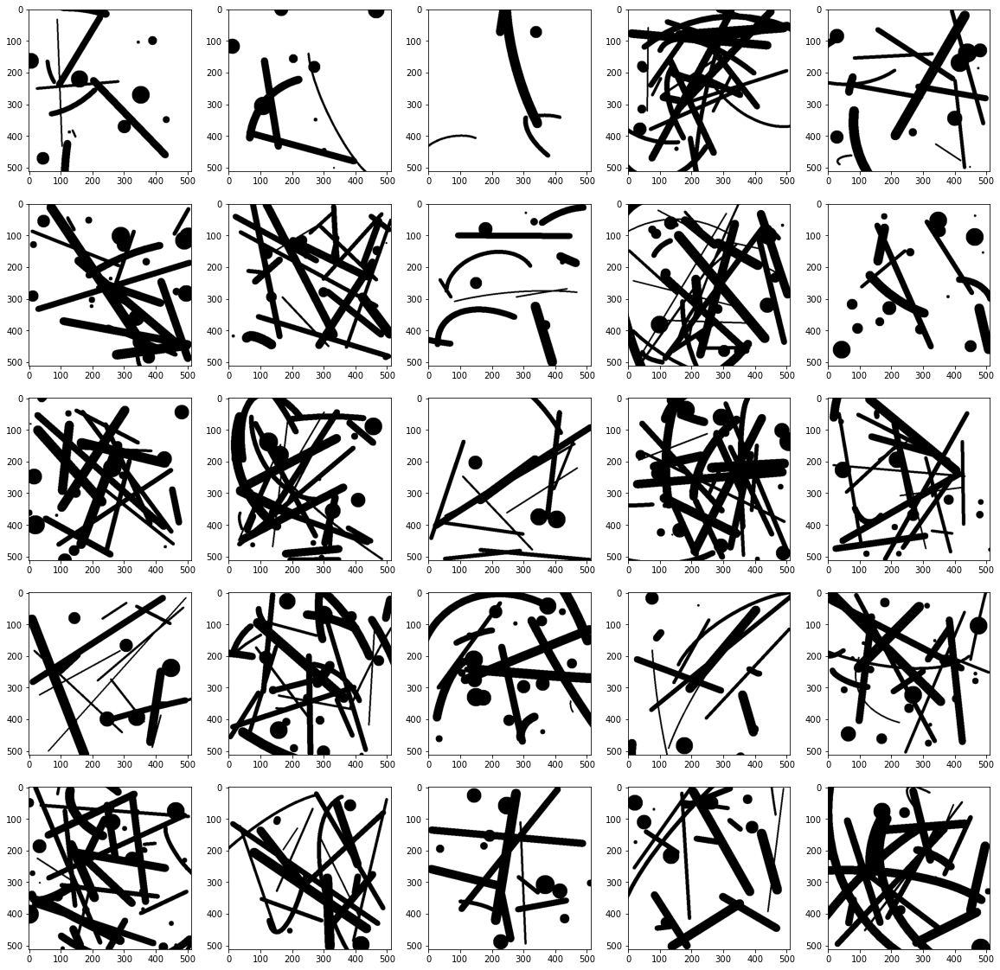

In [ ]:
# Instantiate mask generator
mask_generator = MaskGenerator(512, 512, 3, rand_seed=42)

# Plot the results
_, axes = plt.subplots(5, 5, figsize=(20, 20))
axes = list(itertools.chain.from_iterable(axes))

for i in range(len(axes)):

    # Generate image
    img = mask_generator.sample()

    # Plot image on axis
    axes[i].imshow(img*255)

In [ ]:
class PConv2D(Conv2D):
    def __init__(self, *args, n_channels=3, mono=False, **kwargs):
        super().__init__(*args, **kwargs)
        self.input_spec = [InputSpec(ndim=4), InputSpec(ndim=4)]

    def build(self, input_shape):
        """Adapted from original _Conv() layer of Keras
        param input_shape: list of dimensions for [img, mask]
        """

        if self.data_format == 'channels_first':
            channel_axis = 1
        else:
            channel_axis = -1

        if input_shape[0][channel_axis] is None:
            raise ValueError('The channel dimension of the inputs should be defined. Found `None`.')

        self.input_dim = input_shape[0][channel_axis]

        # Image kernel
        kernel_shape = self.kernel_size + (self.input_dim, self.filters)
        self.img_kernel = self.add_weight(shape=kernel_shape,
                                          initializer=self.kernel_initializer,
                                          name='img_kernel',
                                          regularizer=self.kernel_regularizer,
                                          constraint=self.kernel_constraint)
        # Mask kernel
        self.mask_kernel = self.add_weight(shape=self.kernel_size + (self.input_dim, self.filters),
                                           initializer='ones',
                                           name='mask_kernel')

        # Calculate padding size to achieve zero-padding
        self.pconv_padding = (
            (int((self.kernel_size[0]-1)/2), int((self.kernel_size[0]-1)/2)),
            (int((self.kernel_size[1]-1)/2), int((self.kernel_size[1]-1)/2)),
        )

        # Window size - used for normalization
        self.window_size = self.kernel_size[0] * self.kernel_size[1]

        if self.use_bias:
            self.bias = self.add_weight(shape=(self.filters,),
                                        initializer=self.bias_initializer,
                                        name='bias',
                                        regularizer=self.bias_regularizer,
                                        constraint=self.bias_constraint)
        else:
            self.bias = None
        self.built = True

    def call(self, inputs, mask=None):
        '''
        We will be using the Keras conv2d method, and essentially we have
        to do here is multiply the mask with the input X, before we apply the
        convolutions. For the mask itself, we apply convolutions with all weights
        set to 1.
        Subsequently, we clip mask values to between 0 and 1
        '''

        # Both image and mask must be supplied
        if type(inputs) is not list or len(inputs) != 2:
            raise Exception('PartialConvolution2D must be called on a list of two tensors [img, mask]. Instead got: ' + str(inputs))

        # Padding done explicitly so that padding becomes part of the masked partial convolution
        images = K.spatial_2d_padding(inputs[0], self.pconv_padding, self.data_format)
        masks = K.spatial_2d_padding(inputs[1], self.pconv_padding, self.data_format)

        # Apply convolutions to mask
        mask_output = K.conv2d(
            masks, self.mask_kernel,
            strides=self.strides,
            padding='valid',
            data_format=self.data_format,
            dilation_rate=self.dilation_rate
        )

        # Apply convolutions to image
        img_output = K.conv2d(
            (images * masks), self.img_kernel,
            strides=self.strides,
            padding='valid',
            data_format=self.data_format,
            dilation_rate=self.dilation_rate
        )

        # Calculate the mask ratio on each pixel in the output mask
        mask_ratio = self.window_size / (mask_output + 1e-8)

        # Clip output to be between 0 and 1
        mask_output = K.clip(mask_output, 0, 1)

        # Remove ratio values where there are holes
        mask_ratio = mask_ratio * mask_output

        # Normalize image output
        img_output = img_output * mask_ratio

        # Apply bias only to the image (if chosen to do so)
        if self.use_bias:
            img_output = K.bias_add(
                img_output,
                self.bias,
                data_format=self.data_format)

        # Apply activations on the image
        if self.activation is not None:
            img_output = self.activation(img_output)

        return [img_output, mask_output]

    def compute_output_shape(self, input_shape):
        if self.data_format == 'channels_last':
            space = input_shape[0][1:-1]
            new_space = []
            for i in range(len(space)):
                new_dim = conv_utils.conv_output_length(
                    space[i],
                    self.kernel_size[i],
                    padding='same',
                    stride=self.strides[i],
                    dilation=self.dilation_rate[i])
                new_space.append(new_dim)
            new_shape = (input_shape[0][0],) + tuple(new_space) + (self.filters,)
            return [new_shape, new_shape]
        if self.data_format == 'channels_first':
            space = input_shape[2:]
            new_space = []
            for i in range(len(space)):
                new_dim = conv_utils.conv_output_length(
                    space[i],
                    self.kernel_size[i],
                    padding='same',
                    stride=self.strides[i],
                    dilation=self.dilation_rate[i])
                new_space.append(new_dim)
            new_shape = (input_shape[0], self.filters) + tuple(new_space)
            return [new_shape, new_shape]

Shape of image is: (639, 960, 3)


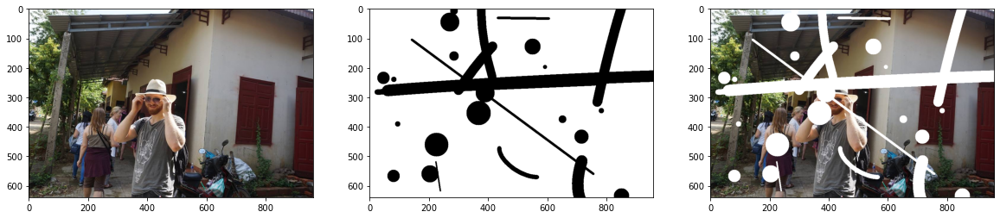

In [ ]:
# Load image
img = cv2.imread('sample_image.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
shape = img.shape
print(f"Shape of image is: {shape}")

# Instantiate mask generator
mask_generator = MaskGenerator(shape[0], shape[1], 3, rand_seed=42)

# Load mask
mask = mask_generator.sample()

# Image + mask
masked_img = deepcopy(img)
masked_img[mask==0] = 255

# Show side by side
_, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(img)
axes[1].imshow(mask*255)
axes[2].imshow(masked_img)
plt.show()

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

# Input images and masks
input_img = Input(shape=(shape[0], shape[1], shape[2],))
input_mask = Input(shape=(shape[0], shape[1], shape[2],))
output_img, output_mask1 = PConv2D(8, kernel_size=(7,7), strides=(2,2))([input_img, input_mask])
output_img, output_mask2 = PConv2D(16, kernel_size=(5,5), strides=(2,2))([output_img, output_mask1])
output_img, output_mask3 = PConv2D(32, kernel_size=(5,5), strides=(2,2))([output_img, output_mask2])
output_img, output_mask4 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask3])
output_img, output_mask5 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask4])
output_img, output_mask6 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask5])
output_img, output_mask7 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask6])
output_img, output_mask8 = PConv2D(64, kernel_size=(3,3), strides=(2,2))([output_img, output_mask7])

# Create model
model = Model(
    inputs=[input_img, input_mask],
    outputs=[
        output_img, output_mask1, output_mask2,
        output_mask3, output_mask4, output_mask5,
        output_mask6, output_mask7, output_mask8
    ])
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

# Show summary of the model
model.summary()

Metal device set to: Apple M1


2024-08-04 20:39:01.918397: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-08-04 20:39:01.918737: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 639, 960, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_2 (InputLayer)           [(None, 639, 960, 3  0           []                               
                                )]                                                                
                                                                                                  
 p_conv2d (PConv2D)             [(None, 320, 480, 8  2360        ['input_1[0][0]',                
                                ),                                'input_2[0][0]']            

In [ ]:
formatted_img = np.expand_dims(masked_img, 0) / 255
formatted_mask = np.expand_dims(mask, 0)
print(f"Original Mask Shape: {formatted_mask.shape} - Max value in mask: {np.max(formatted_mask)}")

output_img, o1, o2, o3, o4, o5, o6, o7, o8 = model.predict([formatted_img, formatted_mask])

Original Mask Shape: (1, 639, 960, 3) - Max value in mask: 1


2024-08-04 20:39:04.165311: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2024-08-04 20:39:04.268149: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


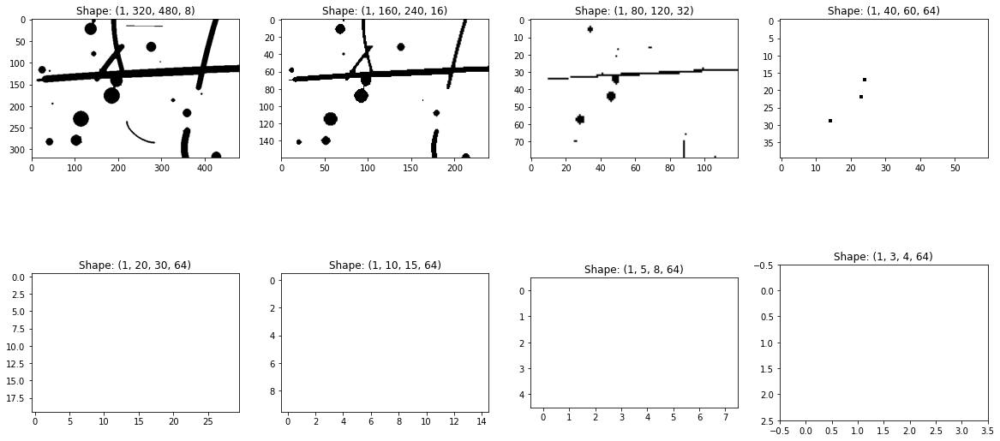

In [ ]:
_, axes = plt.subplots(2, 4, figsize=(20, 10))
axes[0][0].imshow(o1[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][1].imshow(o2[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][2].imshow(o3[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][3].imshow(o4[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][0].imshow(o5[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][1].imshow(o6[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][2].imshow(o7[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[1][3].imshow(o8[0, :,:, 0], cmap = 'gray', vmin=0, vmax=1)
axes[0][0].set_title(f"Shape: {o1.shape}")
axes[0][1].set_title(f"Shape: {o2.shape}")
axes[0][2].set_title(f"Shape: {o3.shape}")
axes[0][3].set_title(f"Shape: {o4.shape}")
axes[1][0].set_title(f"Shape: {o5.shape}")
axes[1][1].set_title(f"Shape: {o6.shape}")
axes[1][2].set_title(f"Shape: {o7.shape}")
axes[1][3].set_title(f"Shape: {o8.shape}")
plt.show()

In [ ]:
class L1Loss(Layer):
    def call(self, y_true, y_pred):
        return tf.reduce_mean(tf.abs(y_pred - y_true), axis=-1)

class GramMatrix(Layer):
    def call(self, x):
        # Ensure input is in [B, H, W, C] format
        x = tf.transpose(x, perm=[0, 3, 1, 2])
        shape = tf.shape(x)
        B, C, H, W = shape[0], shape[1], shape[2], shape[3]

        # Reshape x and compute the Gram matrix
        features = tf.reshape(x, (B, C, H * W))
        gram = tf.matmul(features, features, transpose_b=True)
        gram = gram / tf.cast(C * H * W, tf.float32)
        return gram

class PConvUnet(object):

    def __init__(self, img_rows=512, img_cols=512, vgg_weights="imagenet", inference_only=False, net_name='default', gpus=1, vgg_device=None):
        """Create the PConvUnet. If variable image size, set img_rows and img_cols to None

        Args:
            img_rows (int): image height.
            img_cols (int): image width.
            vgg_weights (str): which weights to pass to the vgg network.
            inference_only (bool): initialize BN layers for inference.
            net_name (str): Name of this network (used in logging).
            gpus (int): How many GPUs to use for training.
            vgg_device (str): In case of training with multiple GPUs, specify which device to run VGG inference on.
                e.g. if training on 8 GPUs, vgg inference could be off-loaded exclusively to one GPU, instead of
                running on one of the GPUs which is also training the UNet.
        """

        # Settings
        self.img_rows = img_rows
        self.img_cols = img_cols
        self.img_overlap = 30
        self.inference_only = inference_only
        self.net_name = net_name
        self.gpus = gpus
        self.vgg_device = vgg_device

        # Scaling for VGG input
        self.mean = [0.485, 0.456, 0.406]
        self.std = [0.229, 0.224, 0.225]

        # Assertions
        assert self.img_rows >= 256, 'Height must be >256 pixels'
        assert self.img_cols >= 256, 'Width must be >256 pixels'

        # Set current epoch
        self.current_epoch = 0

        # VGG layers to extract features from (first maxpooling layers, see pp. 7 of paper)
        self.vgg_layers = [3, 6, 10]

        # Instantiate the vgg network
        with tf.device(self.vgg_device if self.vgg_device else "/cpu:0"):
            self.vgg = self.build_vgg(vgg_weights)

        # Create UNet-like model
        if self.gpus <= 1:
            self.model, self.inputs_mask = self.build_pconv_unet()
            self.compile_pconv_unet(self.model)
        else:
            with tf.device("/cpu:0"):
                self.model, self.inputs_mask = self.build_pconv_unet()
            self.model = multi_gpu_model(self.model, gpus=self.gpus)
            self.compile_pconv_unet(self.model)

    def build_vgg(self, weights="imagenet"):
        """
        Load pre-trained VGG16 from keras applications
        Extract features to be used in loss function from last conv layer, see architecture at:
        https://github.com/keras-team/keras/blob/master/keras/applications/vgg16.py
        """
        # Input image to extract features from
        img = Input(shape=(self.img_rows, self.img_cols, 3))

        # Mean center and rescale by variance as in PyTorch
        processed = Lambda(lambda x: (x - self.mean) / self.std)(img)

        # Get the VGG network from Keras applications
        if weights in ['imagenet', None]:
            vgg = VGG16(weights=weights, include_top=False, input_tensor=processed)
        else:
            vgg = VGG16(weights=None, include_top=False, input_tensor=processed)
            vgg.load_weights(weights, by_name=True)

        # Extract features from specified VGG layers
        feature_layers = [vgg.layers[i].output for i in self.vgg_layers]

        # Create a new model that outputs the desired VGG layers
        model = Model(inputs=img, outputs=feature_layers)
        model.trainable = False
        model.compile(loss='mse', optimizer='adam')

        return model

    def build_pconv_unet(self, train_bn=True):
        """Build the PConvUnet model"""

        # INPUTS
        inputs_img = Input((self.img_rows, self.img_cols, 3), name='inputs_img')
        inputs_mask = Input((self.img_rows, self.img_cols, 3), name='inputs_mask')

        # ENCODER
        def encoder_layer(img_in, mask_in, filters, kernel_size, bn=True):
            conv, mask = PConv2D(filters, kernel_size, strides=2, padding='same')([img_in, mask_in])
            if bn:
                conv = BatchNormalization(name='EncBN'+str(encoder_layer.counter))(conv, training=train_bn)
            conv = Activation('relu')(conv)
            encoder_layer.counter += 1
            return conv, mask
        encoder_layer.counter = 0

        e_conv1, e_mask1 = encoder_layer(inputs_img, inputs_mask, 64, 7, bn=False)
        e_conv2, e_mask2 = encoder_layer(e_conv1, e_mask1, 128, 5)
        e_conv3, e_mask3 = encoder_layer(e_conv2, e_mask2, 256, 5)
        e_conv4, e_mask4 = encoder_layer(e_conv3, e_mask3, 512, 3)
        e_conv5, e_mask5 = encoder_layer(e_conv4, e_mask4, 512, 3)
        e_conv6, e_mask6 = encoder_layer(e_conv5, e_mask5, 512, 3)
        e_conv7, e_mask7 = encoder_layer(e_conv6, e_mask6, 512, 3)
        e_conv8, e_mask8 = encoder_layer(e_conv7, e_mask7, 512, 3)

        # DECODER
        def decoder_layer(img_in, mask_in, e_conv, e_mask, filters, kernel_size, bn=True):
            up_img = UpSampling2D(size=(2,2))(img_in)
            up_mask = UpSampling2D(size=(2,2))(mask_in)
            concat_img = concatenate([e_conv, up_img], axis=-1)  # Use -1 for channels-last
            concat_mask = concatenate([e_mask, up_mask], axis=-1)  # Use -1 for channels-last
            conv, mask = PConv2D(filters, kernel_size, padding='same')([concat_img, concat_mask])
            if bn:
                conv = BatchNormalization()(conv)
            # conv = LeakyReLU(negative_slope=0.2)(conv)
            conv = LeakyReLU(alpha=0.2)(conv)
            return conv, mask

        d_conv9, d_mask9 = decoder_layer(e_conv8, e_mask8, e_conv7, e_mask7, 512, 3)
        d_conv10, d_mask10 = decoder_layer(d_conv9, d_mask9, e_conv6, e_mask6, 512, 3)
        d_conv11, d_mask11 = decoder_layer(d_conv10, d_mask10, e_conv5, e_mask5, 512, 3)
        d_conv12, d_mask12 = decoder_layer(d_conv11, d_mask11, e_conv4, e_mask4, 512, 3)
        d_conv13, d_mask13 = decoder_layer(d_conv12, d_mask12, e_conv3, e_mask3, 256, 3)
        d_conv14, d_mask14 = decoder_layer(d_conv13, d_mask13, e_conv2, e_mask2, 128, 3)
        d_conv15, d_mask15 = decoder_layer(d_conv14, d_mask14, e_conv1, e_mask1, 64, 3)
        d_conv16, d_mask16 = decoder_layer(d_conv15, d_mask15, inputs_img, inputs_mask, 3, 3, bn=False)
        outputs = Activation('sigmoid')(d_conv16)

        model = Model(inputs=[inputs_img, inputs_mask], outputs=outputs)

        return model, inputs_mask

    def compile_pconv_unet(self, model, lr=0.0002):
        """Compile the PConvUnet model"""
        # Define loss function and optimizer
        self.model = model
        self.model.compile(optimizer=Adam(learning_rate=lr), loss=self.get_loss())

    def get_loss(self):
        """Get the loss function for the model"""
        def loss(y_true, y_pred):
            mask = tf.cast(tf.greater(y_true, 0), dtype=tf.float32)

            # Get VGG features
            vgg_out = self.vgg(y_pred)
            vgg_gt = self.vgg(y_true)

            # Compute loss components
            l1 = L1Loss()(mask * y_true, mask * y_pred)
            l2 = L1Loss()((1-mask) * y_true, (1-mask) * y_pred)

            # Calculate VGG feature loss
            vgg_loss = 0
            for vgg_out_layer, vgg_gt_layer in zip(vgg_out, vgg_gt):
                vgg_loss += tf.reduce_sum(L1Loss()(vgg_out_layer, vgg_gt_layer))

            # Calculate Gram matrix loss
            gram_loss = 0
            for vgg_out_layer, vgg_gt_layer in zip(vgg_out, vgg_gt):
                gram_loss += tf.reduce_sum(GramMatrix()(vgg_out_layer) - GramMatrix()(vgg_gt_layer))

            # Return total loss
            return l1 + 6*l2 + 0.05*vgg_loss + 120*gram_loss

        return loss


    def dilated_mask(self, mask):
        """Calculate dilated mask"""
        kernel = tf.ones((3, 3, mask.shape[-1], mask.shape[-1]), dtype=tf.float32)
        dilated_mask = tf.nn.conv2d(1-mask, kernel, strides=[1, 1, 1, 1], padding='SAME')
        dilated_mask = tf.cast(dilated_mask > 0, tf.float32)
        return dilated_mask

    def fit(self, generator, *args, **kwargs):
        """Fit the U-Net to a (images, targets) generator"""
        self.model.fit(generator, *args, **kwargs)

    def summary(self):
        """Get summary of the UNet model"""
        print(self.model.summary())

    def load(self, filepath, train_bn=True, lr=0.0002):
        """Load model weights from a file"""
        # Create UNet-like model
        self.model, self.inputs_mask = self.build_pconv_unet(train_bn)
        self.compile_pconv_unet(self.model, lr)

        # Load weights into model
        epoch = int(os.path.basename(filepath).split('.')[1].split('-')[0])
        assert epoch > 0, "Could not parse weight file. Should include the epoch"
        self.current_epoch = epoch
        self.model.load_weights(filepath)

    @staticmethod
    def PSNR(y_true, y_pred):
        """Peak Signal to Noise Ratio"""
        return -10.0 * tf.math.log(tf.reduce_mean(tf.square(y_pred - y_true))) / tf.math.log(10.0)

    @staticmethod
    def current_timestamp():
        return datetime.now().strftime('%Y-%m-%d-%H-%M-%S')


In [ ]:
# Settings
BATCH_SIZE = 4

# Imagenet Rescaling
MEAN = np.array([0.485, 0.456, 0.406])
STD = np.array([0.229, 0.224, 0.225])

In [ ]:
PConvUnet().summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs_img (InputLayer)        [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 inputs_mask (InputLayer)       [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 p_conv2d_8 (PConv2D)           [(None, 256, 256, 6  18880       ['inputs_img[0][0]',             
                                4),                               'inputs_mask[0][0]']      

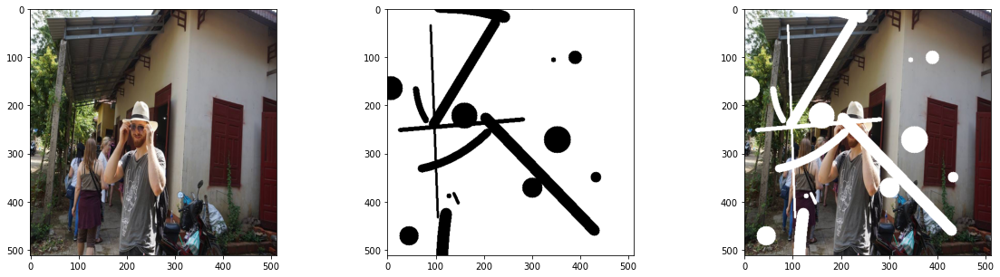

In [ ]:
# Instantiate mask generator
mask_generator = MaskGenerator(512, 512, 3, rand_seed=42)

# Load image
img = np.array(Image.open('sample_image.jpg').resize((512, 512))) / 255

# Load mask
mask = mask_generator.sample()

# Image + mask
masked_img = copy.deepcopy(img)
masked_img[mask==0] = 1

# Show side by side
_, axes = plt.subplots(1, 3, figsize=(20, 5))
axes[0].imshow(img)
axes[1].imshow(mask*255)
axes[2].imshow(masked_img)
plt.show()

In [ ]:
!mkdir data
!mkdir data/logs
!mkdir data/logs/single_image_test

mkdir: data: File exists
mkdir: data/logs: File exists
mkdir: data/logs/single_image_test: File exists


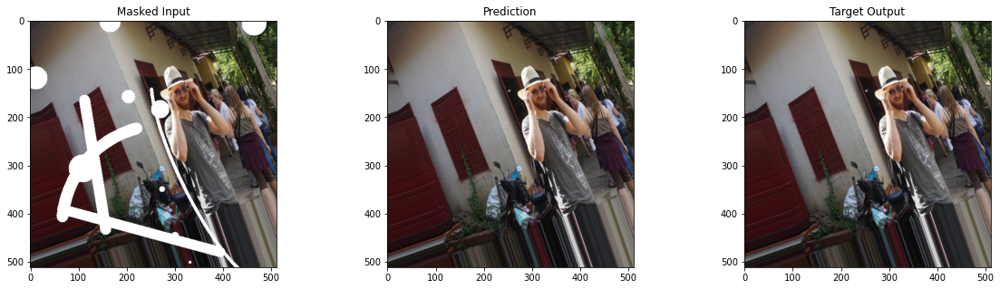

In [ ]:
# Define the custom callback
class PlotProgress(tf.keras.callbacks.Callback):
    def __init__(self, generator, batch_size):
        super().__init__()
        self.generator = generator
        self.batch_size = batch_size

    def on_epoch_end(self, epoch, logs=None):
        # Get a batch of data
        [masked, mask], ori = next(self.generator)
        # Make predictions
        pred = self.model.predict([masked, mask], batch_size=self.batch_size)

        # Plot the masked input, prediction, and target output
        plot_sample_data(masked[0], ori[0], pred[0])

# Define the plot_sample_data function
def plot_sample_data(masked, ori, pred, middle_title='Raw Mask'):
    _, axes = plt.subplots(1, 3, figsize=(20, 5))
    axes[0].imshow(masked)
    axes[0].set_title('Masked Input')
    # axes[1].imshow(mask * 255)
    # axes[1].set_title(middle_title)
    axes[1].imshow(pred)
    axes[1].set_title('Prediction')
    axes[2].imshow(ori)
    axes[2].set_title('Target Output')
    plt.show()

class DataGenerator(ImageDataGenerator):
    def flow(self, x, *args, **kwargs):
        while True:
            # Get augmented image samples
            ori = next(super().flow(x, *args, **kwargs))

            # Get masks for each image sample
            mask = np.stack([mask_generator.sample() for _ in range(ori.shape[0])], axis=0)

            # Apply masks to all image samples
            masked = copy.deepcopy(ori)
            masked[mask == 0] = 1

            # Yield ([masked, mask], ori) training batches
            gc.collect()
            yield [masked, mask], ori

# Settings
BATCH_SIZE = 4

# Instantiate mask generator
mask_generator = MaskGenerator(512, 512, 3, rand_seed=42)

# Load image
img = np.array(Image.open('sample_image.jpg').resize((512, 512))) / 255

# Load mask
mask = mask_generator.sample()

# Image + mask
masked_img = copy.deepcopy(img)
masked_img[mask == 0] = 1

# # Show side by side
# _, axes = plt.subplots(1, 3, figsize=(20, 5))
# axes[0].imshow(img)
# axes[1].imshow(mask * 255)
# axes[2].imshow(masked_img)
# plt.show()

# Create datagen
datagen = DataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

# Create generator from numpy array
batch = np.stack([img for _ in range(BATCH_SIZE)], axis=0)
generator = datagen.flow(x=batch, batch_size=BATCH_SIZE)

[m1, m2], o1 = next(generator)
plot_sample_data(m1[0], o1[0], o1[0])

# Define wrapped generator
def wrapped_generator():
    while True:
        [masked, mask], ori = next(generator)
        yield (tf.convert_to_tensor(masked, dtype=tf.float32),
               tf.convert_to_tensor(mask, dtype=tf.float32)), \
              tf.convert_to_tensor(ori, dtype=tf.float32)

# Define output signature for the generator
output_signature = (
    (tf.TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32),
     tf.TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32)),
    tf.TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32)
)

# Create a TensorFlow dataset from the generator
dataset = tf.data.Dataset.from_generator(
    wrapped_generator,
    output_signature=output_signature
)

2000/2000 [==============================] - 1091s 0ms/step - loss: 0.9629 - PSNR: 23.9135


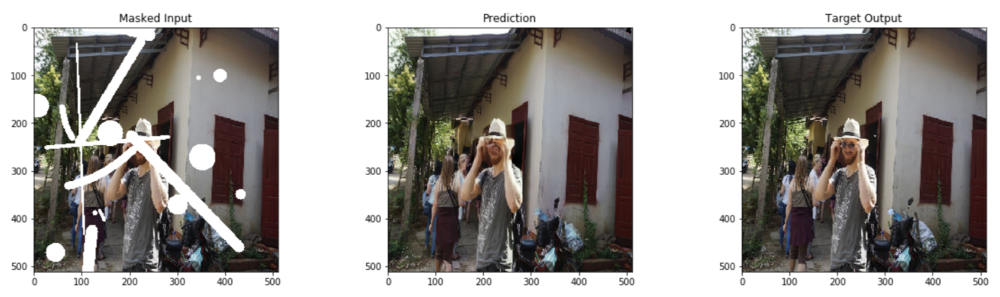

2000/2000 [==============================] - 1092s 0ms/step - loss: 0.9517 - PSNR: 23.9629


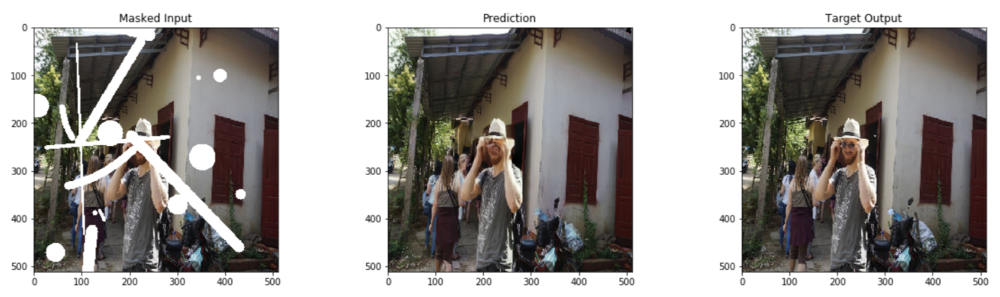

2000/2000 [==============================] - 1090s 0ms/step - loss: 0.9391 - PSNR: 24.0465


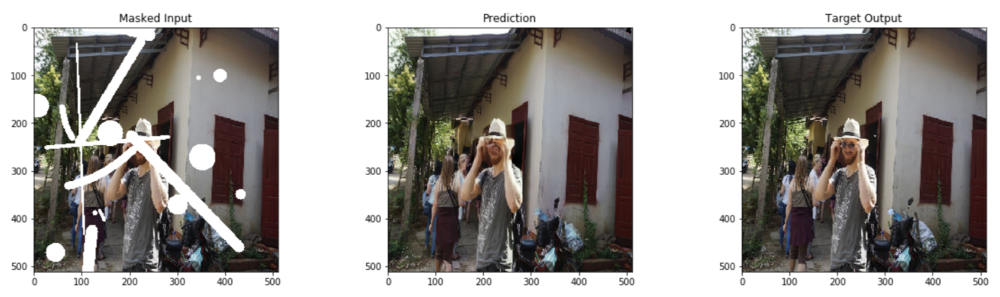

2000/2000 [==============================] - 1091s 0ms/step - loss: 0.9272 - PSNR: 24.1397


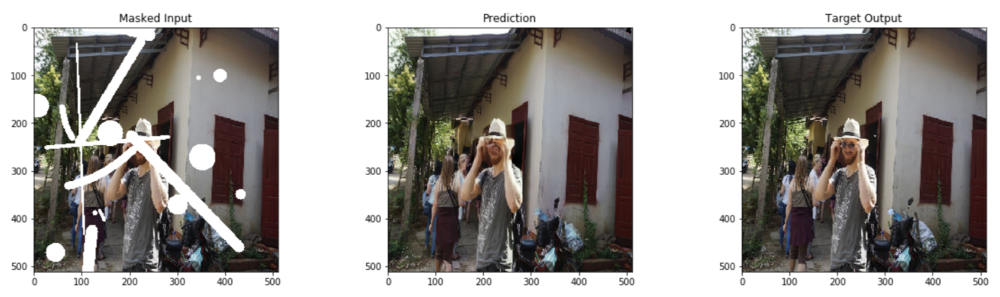

2000/2000 [==============================] - 1090s 0ms/step - loss: 0.9198 - PSNR: 24.1806


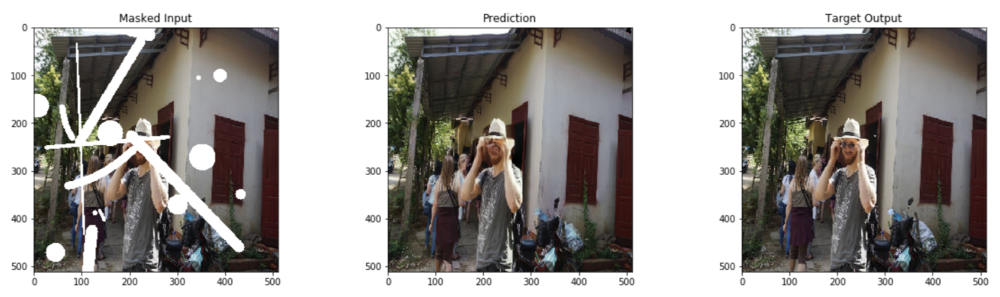

2000/2000 [==============================] - 1090s 0ms/step - loss: 0.9129 - PSNR: 24.2171


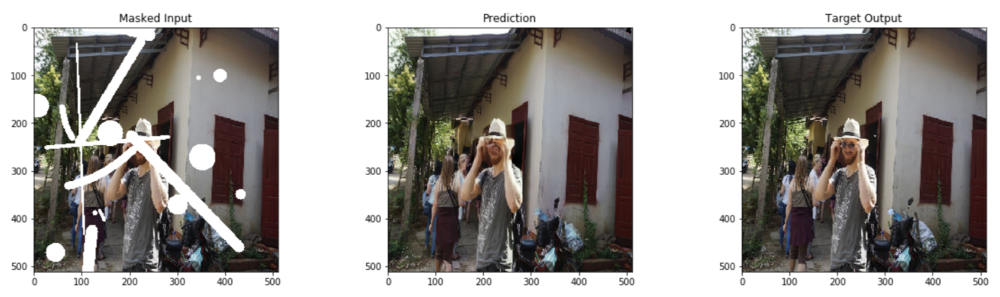

2000/2000 [==============================] - 1092s 0ms/step - loss: 0.9062 - PSNR: 24.2482


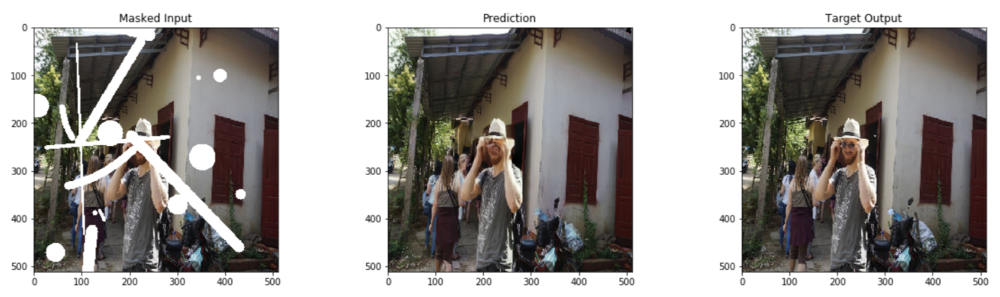

2000/2000 [==============================] - 1092s 0ms/step - loss: 0.8966 - PSNR: 24.3190


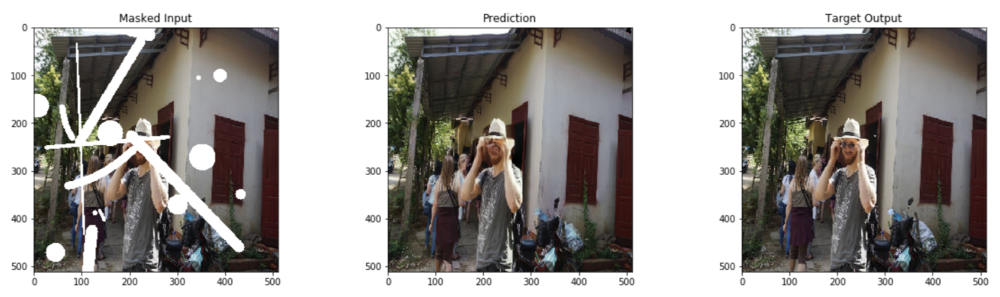

2000/2000 [==============================] - 1101s 0ms/step - loss: 0.8995 - PSNR: 24.2642


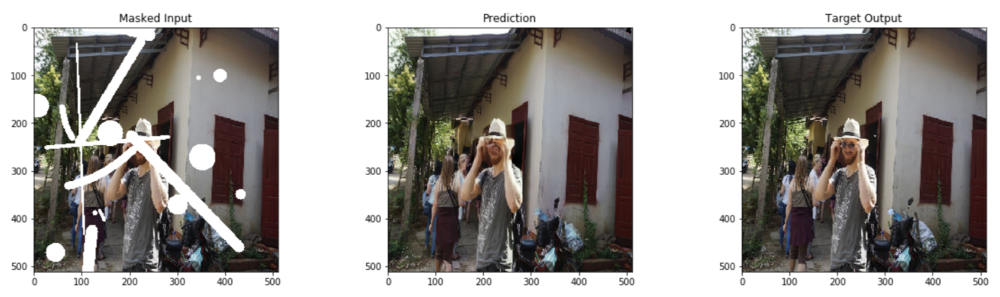

2000/2000 [==============================] - 1113s 0ms/step - loss: 0.8872 - PSNR: 24.3789


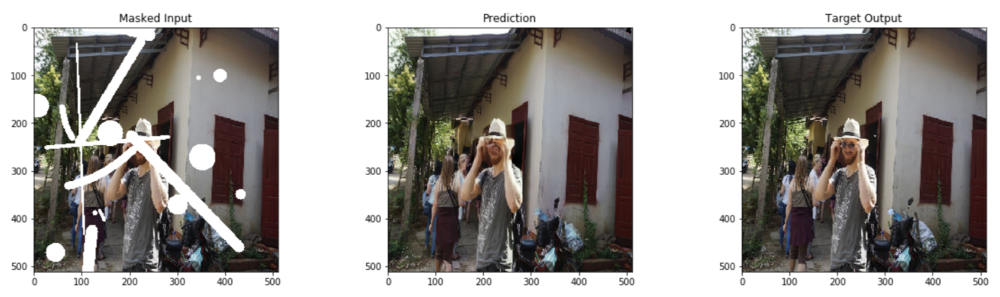

In [ ]:
model = PConvUnet(vgg_weights='/content/drive/MyDrive/weights/pconv_imagenet.h5')

model.compile_pconv_unet(model.model)

model.fit(dataset, steps_per_epoch=2000, epochs=10, callbacks=[PlotProgress(generator, BATCH_SIZE)])

In [ ]:
class PConv2D(tf.keras.layers.Layer):
    def __init__(self, filters, kernel_size, strides=1, padding='same', use_bias=True, **kwargs):
        super(PConv2D, self).__init__(**kwargs)
        self.filters = filters
        self.kernel_size = kernel_size
        self.strides = strides
        self.padding = padding
        self.use_bias = use_bias

    def build(self, input_shape):
        self.depthwise_conv = tf.keras.layers.DepthwiseConv2D(
            self.kernel_size,
            strides=self.strides,
            padding=self.padding,
            use_bias=False
        )
        self.pointwise_conv = tf.keras.layers.Conv2D(
            self.filters,
            kernel_size=(1, 1),
            padding=self.padding,
            use_bias=self.use_bias
        )

    def call(self, inputs):
        img, mask = inputs

        # Apply depthwise convolution to image and mask
        img_conv = self.depthwise_conv(img)
        mask_conv = self.depthwise_conv(mask)

        # Calculate mask ratio
        mask_ratio = tf.clip_by_value(mask_conv, 0, 1)

        # Resize mask_ratio to match img_conv dimensions
        mask_ratio_resized = tf.image.resize(mask_ratio, size=[tf.shape(img_conv)[1], tf.shape(img_conv)[2]], method='nearest')

        # Expand dimensions to match img_conv filters
        mask_ratio_expanded = tf.expand_dims(mask_ratio_resized, axis=-1)  # Shape: [batch, height, width, channels, 1]
        mask_ratio_expanded = tf.tile(mask_ratio_expanded, [1, 1, 1, 1, self.filters])  # Shape: [batch, height, width, channels, filters]

        # Apply pointwise convolution to img_conv
        img_conv = self.pointwise_conv(img_conv)

        # Reshape mask_ratio_expanded to match img_conv for element-wise multiplication
        mask_ratio_expanded = tf.reshape(mask_ratio_expanded, [tf.shape(mask_ratio_expanded)[0], tf.shape(mask_ratio_expanded)[1], tf.shape(mask_ratio_expanded)[2], self.filters])

        # Element-wise multiplication
        output_img = img_conv * mask_ratio_expanded

        return output_img, mask_ratio_expanded

In [ ]:
class L1Loss(Layer):
    def call(self, y_true, y_pred):
        return tf.reduce_mean(tf.abs(y_pred - y_true), axis=-1)

class GramMatrix(Layer):
    def call(self, x):
        x = tf.transpose(x, perm=[0, 3, 1, 2])
        shape = tf.shape(x)
        B, C, H, W = shape[0], shape[1], shape[2], shape[3]

        features = tf.reshape(x, (B, C, H * W))
        gram = tf.matmul(features, features, transpose_b=True)
        gram = gram / tf.cast(C * H * W, tf.float32)
        return gram

class PConvUnetModified(object):
    def __init__(self, img_rows=512, img_cols=512, vgg_weights="imagenet", inference_only=False, net_name='default', gpus=1, vgg_device=None):
        self.img_rows = img_rows
        self.img_cols = img_cols
        self.img_overlap = 30
        self.inference_only = inference_only
        self.net_name = net_name
        self.gpus = gpus
        self.vgg_device = vgg_device

        self.mean = [0.485, 0.456, 0.406]
        self.std = [0.229, 0.224, 0.225]

        assert self.img_rows >= 256, 'Height must be >256 pixels'
        assert self.img_cols >= 256, 'Width must be >256 pixels'

        self.current_epoch = 0
        self.vgg_layers = [3, 6, 10]

        with tf.device(self.vgg_device if self.vgg_device else "/cpu:0"):
            self.vgg = self.build_vgg(vgg_weights)

        if self.gpus <= 1:
            self.model, self.inputs_mask = self.build_pconv_unet()
            self.compile_pconv_unet(self.model)
        else:
            with tf.device("/cpu:0"):
                self.model, self.inputs_mask = self.build_pconv_unet()
            self.model = multi_gpu_model(self.model, gpus=self.gpus)
            self.compile_pconv_unet(self.model)

    def build_vgg(self, weights="imagenet"):
        img = Input(shape=(self.img_rows, self.img_cols, 3))
        processed = Lambda(lambda x: (x - self.mean) / self.std)(img)
        if weights in ['imagenet', None]:
            vgg = VGG16(weights=weights, include_top=False, input_tensor=processed)
        else:
            vgg = VGG16(weights=None, include_top=False, input_tensor=processed)
            vgg.load_weights(weights, by_name=True)
        feature_layers = [vgg.layers[i].output for i in self.vgg_layers]
        model = Model(inputs=img, outputs=feature_layers)
        model.trainable = False
        model.compile(loss='mse', optimizer='adam')
        return model

    def build_pconv_unet(self, train_bn=True):
        inputs_img = Input((self.img_rows, self.img_cols, 3), name='inputs_img')
        inputs_mask = Input((self.img_rows, self.img_cols, 3), name='inputs_mask')

        def encoder_layer(img_in, mask_in, filters, kernel_size, bn=True):
            conv, mask = PConv2D(filters, kernel_size, strides=2, padding='same')([img_in, mask_in])
            if bn:
                conv = BatchNormalization(name='EncBN'+str(encoder_layer.counter))(conv, training=train_bn)
            conv = Activation('relu')(conv)
            encoder_layer.counter += 1
            return conv, mask
        encoder_layer.counter = 0

        e_conv1, e_mask1 = encoder_layer(inputs_img, inputs_mask, 64, 7, bn=False)
        e_conv2, e_mask2 = encoder_layer(e_conv1, e_mask1, 128, 5)
        e_conv3, e_mask3 = encoder_layer(e_conv2, e_mask2, 256, 5)
        e_conv4, e_mask4 = encoder_layer(e_conv3, e_mask3, 512, 3)
        e_conv5, e_mask5 = encoder_layer(e_conv4, e_mask4, 512, 3)
        e_conv6, e_mask6 = encoder_layer(e_conv5, e_mask5, 512, 3)
        e_conv7, e_mask7 = encoder_layer(e_conv6, e_mask6, 512, 3)
        e_conv8, e_mask8 = encoder_layer(e_conv7, e_mask7, 512, 3)

        def decoder_layer(img_in, mask_in, e_conv, e_mask, filters, kernel_size, bn=True):
            up_img = UpSampling2D(size=(2,2))(img_in)
            up_mask = UpSampling2D(size=(2,2))(mask_in)
            concat_img = concatenate([e_conv, up_img], axis=-1)
            concat_mask = concatenate([e_mask, up_mask], axis=-1)
            conv, mask = PConv2D(filters, kernel_size, padding='same')([concat_img, concat_mask])
            if bn:
                conv = BatchNormalization()(conv)
            conv = Activation('relu')(conv)
            return conv, mask

        d_conv9, d_mask9 = decoder_layer(e_conv8, e_mask8, e_conv7, e_mask7, 512, 3)
        d_conv10, d_mask10 = decoder_layer(d_conv9, d_mask9, e_conv6, e_mask6, 512, 3)
        d_conv11, d_mask11 = decoder_layer(d_conv10, d_mask10, e_conv5, e_mask5, 512, 3)
        d_conv12, d_mask12 = decoder_layer(d_conv11, d_mask11, e_conv4, e_mask4, 512, 3)
        d_conv13, d_mask13 = decoder_layer(d_conv12, d_mask12, e_conv3, e_mask3, 256, 3)
        d_conv14, d_mask14 = decoder_layer(d_conv13, d_mask13, e_conv2, e_mask2, 128, 3)
        d_conv15, d_mask15 = decoder_layer(d_conv14, d_mask14, e_conv1, e_mask1, 64, 3)
        d_conv16 = Conv2D(3, 1, activation='sigmoid', name='final_rgb')(d_conv15)

        model = Model(inputs=[inputs_img, inputs_mask], outputs=d_conv16)

        return model, inputs_mask

    def compile_pconv_unet(self, model):
        def loss_total(y_true, y_pred):
            y_comp = y_true[:, :, :, :3] * y_true[:, :, :, 3:] + y_pred * (1 - y_true[:, :, :, 3:])
            l1 = tf.reduce_mean(tf.abs(y_true[:, :, :, :3] - y_pred), axis=[1, 2, 3])
            vgg_out = self.vgg(y_comp)
            vgg_true = self.vgg(y_true[:, :, :, :3])
            l_vgg = 0
            for v_o, v_t in zip(vgg_out, vgg_true):
                l_vgg += tf.reduce_mean(tf.abs(v_o - v_t), axis=[1, 2, 3])
            l_gram = 0
            for i in range(len(vgg_out)):
                l_gram += tf.reduce_mean(tf.abs(GramMatrix()(vgg_out[i]) - GramMatrix()(vgg_true[i])), axis=[1, 2, 3])
            return l1 + 0.1 * l_vgg + 0.1 * l_gram

        model.compile(optimizer=Adam(learning_rate=2e-4), loss=loss_total)

    def fit(self, generator, epochs=10, steps_per_epoch=100):
        self.model.fit(generator, epochs=epochs, steps_per_epoch=steps_per_epoch)

    def load(self, filepath):
        self.model.load_weights(filepath)

    def summary(self):
        self.model.summary()

PConvUnetModified().summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 inputs_img (InputLayer)        [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 inputs_mask (InputLayer)       [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 p_conv2d_24 (PConv2D)          ((None, 256, 256, 6  403         ['inputs_img[0][0]',             
                                4),                               'inputs_mask[0][0]']      

Epoch 1/10
2000/2000 [==============================] - 97s 0ms/step - loss: 0.9212 - PSNR: 26.3783


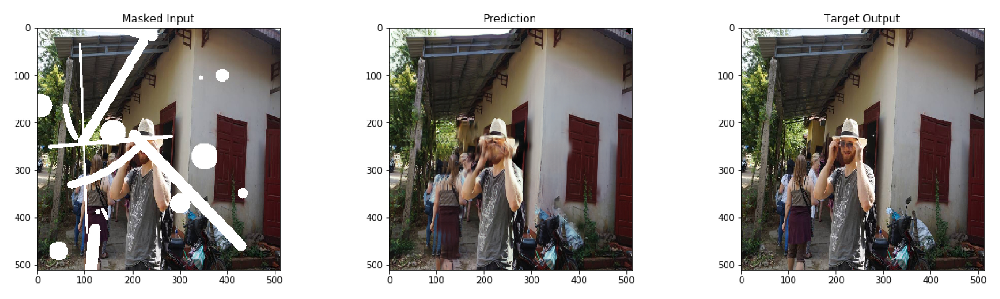

Epoch 2/10
2000/2000 [==============================] - 104s 0ms/step - loss: 0.9398 - PSNR: 26.3421


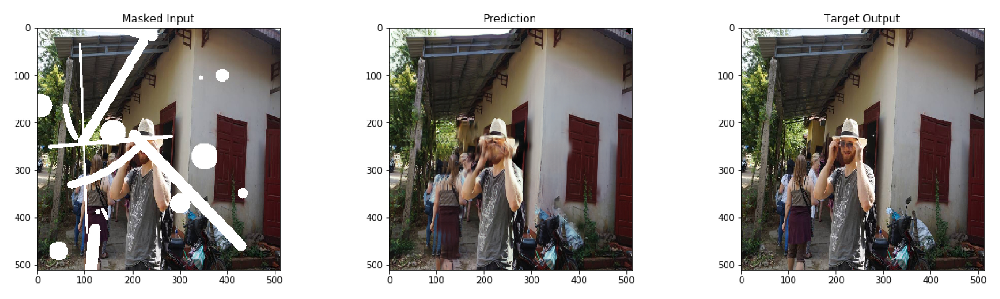

Epoch 3/10
2000/2000 [==============================] - 103s 0ms/step - loss: 0.8885 - PSNR: 26.6344


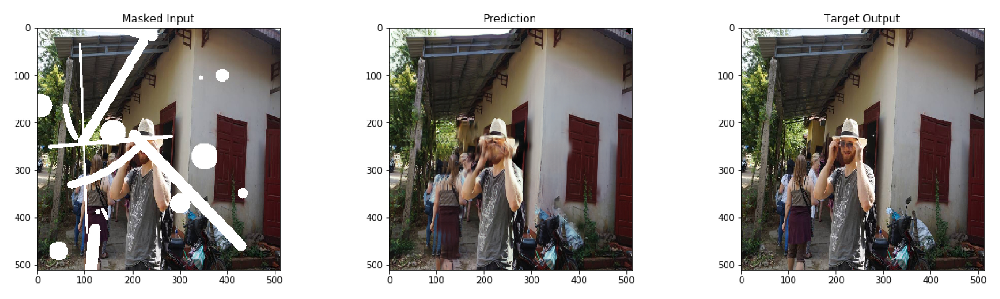

Epoch 4/10
2000/2000 [==============================] - 99s 0ms/step - loss: 0.9263 - PSNR: 26.7653


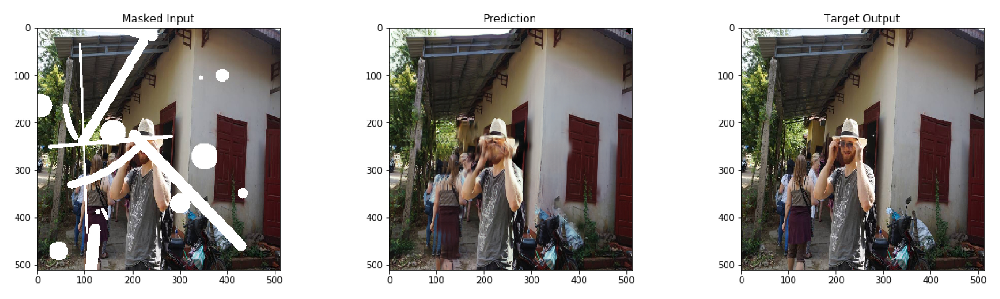

Epoch 5/10
2000/2000 [==============================] - 102s 0ms/step - loss: 0.9150 - PSNR: 26.3975


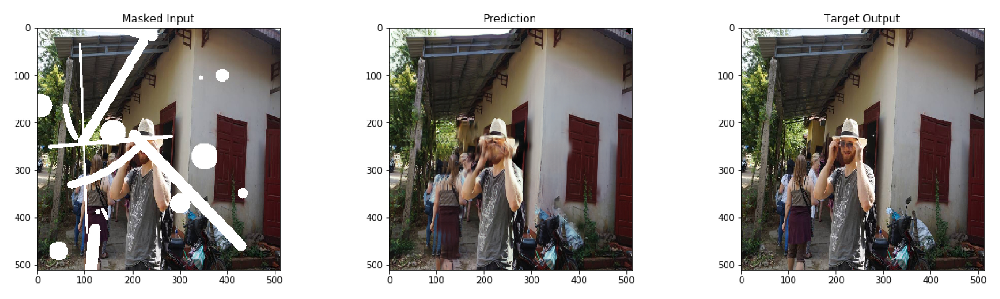

Epoch 6/10
2000/2000 [==============================] - 98s 0ms/step - loss: 0.9029 - PSNR: 26.2274


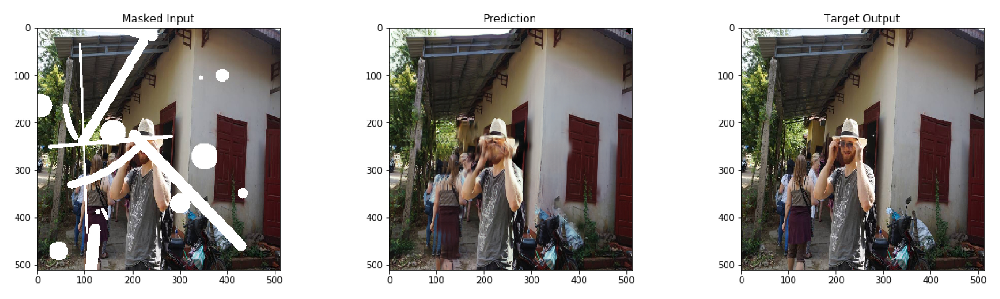

Epoch 7/10
2000/2000 [==============================] - 95s 0ms/step - loss: 0.9218 - PSNR: 26.2452


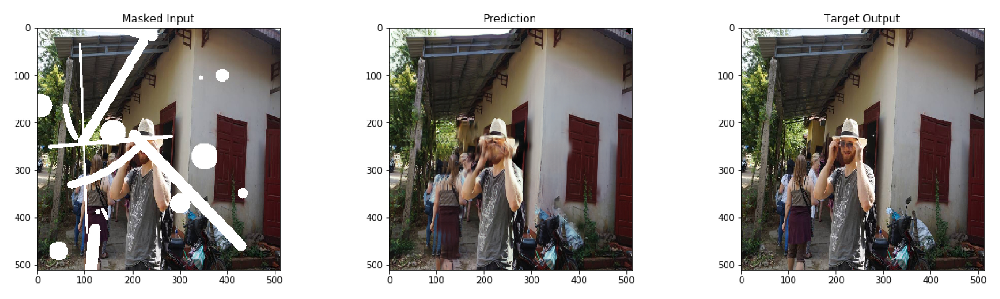

Epoch 8/10
2000/2000 [==============================] - 97s 0ms/step - loss: 0.8872 - PSNR: 26.3426


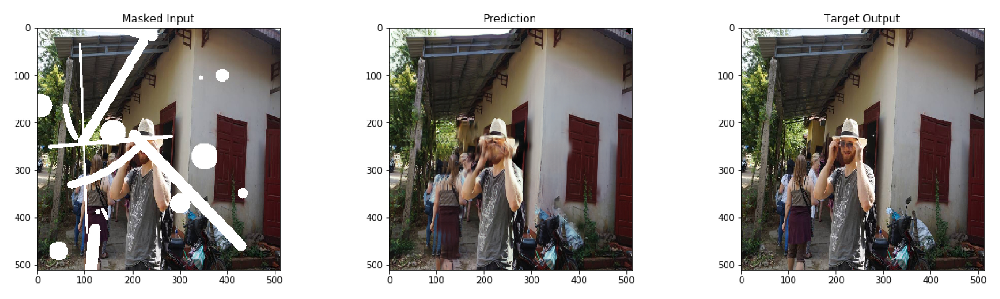

Epoch 9/10
2000/2000 [==============================] - 100s 0ms/step - loss: 0.9351 - PSNR: 26.3517


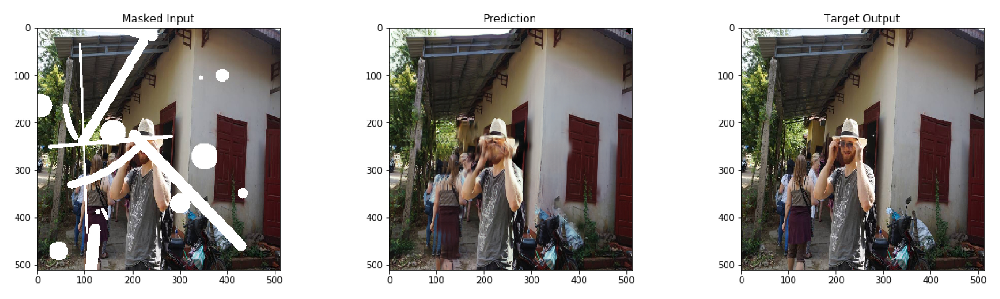

Epoch 10/10
2000/2000 [==============================] - 101s 0ms/step - loss: 0.9199 - PSNR: 26.1271


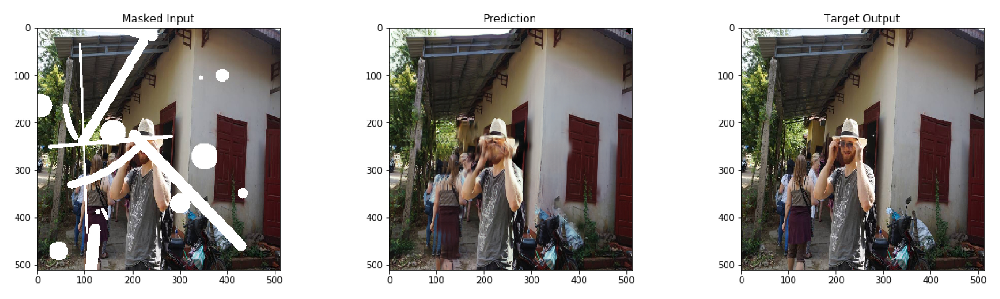

In [ ]:
model = PConvUnetModified()

model.compile_pconv_unet(model.model)

model.fit(dataset, steps_per_epoch=2000, epochs=10, callbacks=[PlotProgress(generator, BATCH_SIZE)])